In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd
from scipy.io.wavfile import write
import librosa

In [6]:
music_file = "Signals/Music/Beethoven Ode to Joy.wav"
music_audio, sr = librosa.load(music_file)

In [25]:
def play_audio(audio_data, sample_rate=sr):
    normalized_audio = np.int16(audio_data / np.max(np.abs(audio_data)) * 32767)

    write("temp_audio.wav", sample_rate, normalized_audio)
    return ipd.Audio("temp_audio.wav")

def plot_signal(signal, _sr=sr):
    duration = len(signal) / _sr
    time = np.linspace(0., duration, len(signal))
    plt.plot(time, signal)
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')
    plt.grid()
    plt.show()

def plot_spectrogram(signal, _sr=sr):
    S = np.abs(librosa.stft(signal))
    S_db = librosa.amplitude_to_db(S, ref=np.max)

    plt.figure(figsize=(10, 6))
    librosa.display.specshow(S_db, sr=_sr, x_axis="time", y_axis="log", cmap='magma')
    # set y limit to 2000, and plot in log scale
    plt.ylim(0, 8000)
    plt.colorbar(label="Intensity [dB]")
    plt.title("Spectrogram")
    plt.xlabel("Time [s]")
    plt.ylabel("Frequency [Hz]")
    plt.show()

def extract_period(audio_data, start_time, end_time, sample_rate=sr):
    start_sample = int(start_time * sample_rate)
    end_sample = int(end_time * sample_rate)
    return audio_data[start_sample:end_sample]

def plot_magnitude_spectrum(ft, freqs):
    plt.plot(freqs, np.abs(ft))
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Magnitude')
    plt.grid()
    plt.show()

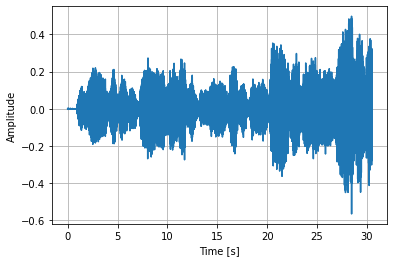

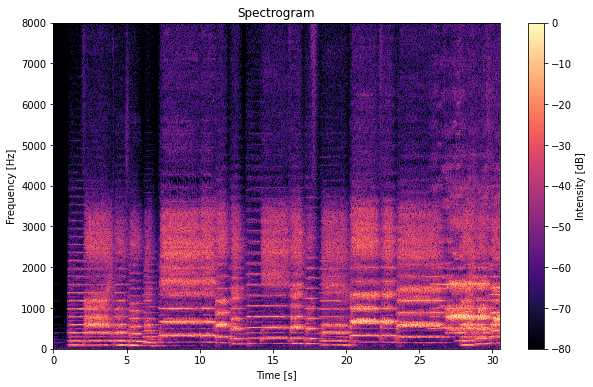

In [7]:
plot_signal(music_audio)
plot_spectrogram(music_audio)
play_audio(music_audio)

In [15]:
def filter_ranges(signal, ranges):
    ft = np.fft.fft(signal)
    ft = np.fft.fftshift(ft)
    freqs = np.fft.fftfreq(len(ft), 1/sr)
    freqs = np.fft.fftshift(freqs)
    for r in ranges:
        ft[(freqs >= r[0]) & (freqs <= r[1])] = 0
        ft[(freqs <= -r[0]) & (freqs >= -r[1])] = 0

    # plot_magnitude_spectrum(ft, freqs)
    ft = np.fft.ifftshift(ft)
    return np.fft.ifft(ft).real

In [16]:
# print("Unfiltered s part")
# s_part = music_audio[15 * sr : 20 * sr]
# play_audio(s_part)

Unfiltered s part


In [27]:
# s_ranges = [
#     (210, 280), (450, 550), (720, 780), (950, 1050), (1200, 1280), (1450, 1520),
#     (1700, 1780), (1950, 2020), (2200, 2270)
# ]
# s_filtered = filter_ranges(s_part, s_ranges)
# print("Filtered s")
# play_audio(s_filtered)

Filtered s


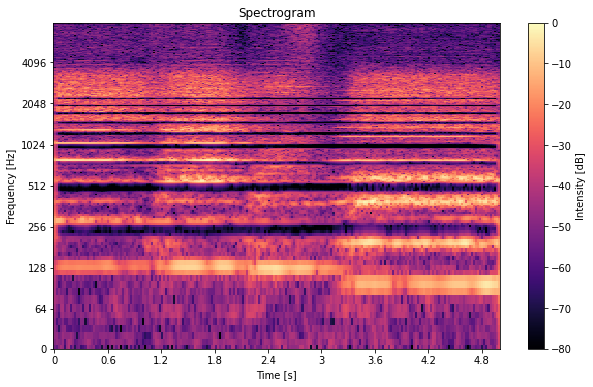

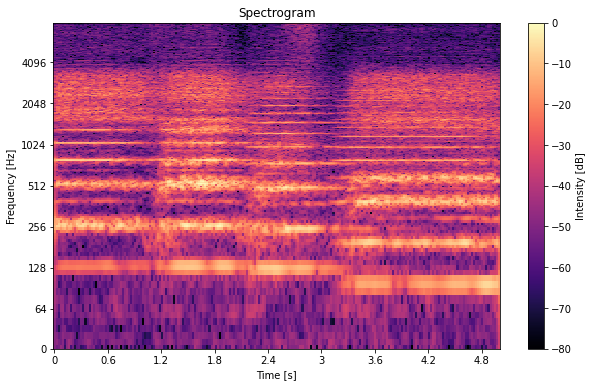

In [28]:
# plot_spectrogram(s_filtered)
# plot_spectrogram(s_part)

In [38]:
ee_part = music_audio[7 * sr : 20 * sr]
print("ee part")
play_audio(ee_part)

ee part


In [40]:
ee_ranges = [
    (250, 350), (500, 530), (650, 670), (780, 820),
    (1020, 1080), (1320, 1350), (1570, 1620), (1840, 1870)
]
ee_filtered = filter_ranges(ee_part, ee_ranges)
print("Filtered ee")
play_audio(ee_filtered)

Filtered ee


In [46]:
filtered_ee_from_music = filter_ranges(music_audio, ee_ranges)
play_audio(filtered_ee_from_music)

In [42]:
ah_part = music_audio[20 * sr : 25 * sr]
print("ah part")
play_audio(ah_part)

ah part


In [43]:
ah_ranges = [
    (300, 370), (600, 730), (940, 1050), (1250, 1370)
]
ah_filtered = filter_ranges(ah_part, ah_ranges)
print("Filtered ah")
play_audio(ah_filtered)

Filtered ah


In [44]:
filtered_ah_from_music = filter_ranges(music_audio, ah_ranges)
print("Filtered ah from music")
play_audio(filtered_ah_from_music)

Filtered ah from music


In [47]:
ode_to_joy, sr = librosa.load("Signals/Music/Ode To Joy.wav")
play_audio(ode_to_joy)

In [48]:
oh_part = ode_to_joy[31 * sr : 35 * sr]
print("OH part")
play_audio(oh_part)

OH part


In [57]:
oh_ranges = [
    (530, 950)
]
oh_filtered = filter_ranges(oh_part, oh_ranges)
print("Filtered OH")
play_audio(oh_filtered)

Filtered OH


In [58]:
filtered_oh_from_music = filter_ranges(ode_to_joy, oh_ranges)
play_audio(filtered_oh_from_music)

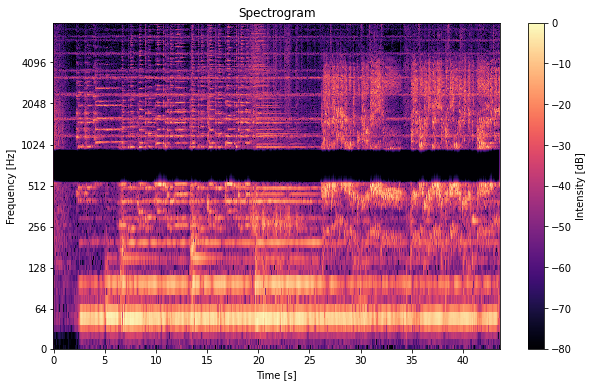

In [59]:
plot_spectrogram(filtered_oh_from_music)